In [6]:
import duckdb
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.dates as mdates
import seaborn as sns


In [7]:
con = duckdb.connect()
parq = "data.parquet"

In [8]:
def hm(parquet_file):
    query = f"""
        SELECT x, y, COUNT(*) AS modifications
        FROM parquet_scan('{parquet_file}')
        GROUP BY x, y
    """
    return con.execute(query).fetchdf().pivot(index="y", columns="x", values="modifications").fillna(0)


In [9]:
df = hm(parq)

In [10]:
df

x,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
y,,,,,,,,,,,,,,,,,,,,,
0,98807.0,11294.0,4721.0,2399.0,1496.0,1079.0,744.0,618.0,430.0,448.0,...,302.0,260.0,349.0,394.0,459.0,546.0,724.0,1451.0,3709.0,30882.0
1,9592.0,12083.0,2152.0,836.0,386.0,337.0,197.0,156.0,147.0,117.0,...,149.0,139.0,161.0,198.0,286.0,357.0,446.0,714.0,2171.0,3255.0
2,3888.0,1840.0,4456.0,1505.0,759.0,591.0,411.0,289.0,249.0,165.0,...,149.0,124.0,87.0,143.0,561.0,444.0,2294.0,1051.0,1302.0,1610.0
3,2080.0,577.0,1062.0,2093.0,1065.0,823.0,494.0,349.0,326.0,241.0,...,279.0,185.0,182.0,224.0,525.0,2660.0,1797.0,1246.0,492.0,707.0
4,1420.0,371.0,479.0,845.0,1255.0,836.0,575.0,415.0,293.0,251.0,...,158.0,162.0,204.0,228.0,2346.0,1634.0,1829.0,750.0,505.0,467.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,258.0,248.0,204.0,244.0,220.0,134.0,129.0,82.0,107.0,102.0,...,67.0,70.0,128.0,97.0,137.0,325.0,157.0,144.0,121.0,332.0
1996,359.0,401.0,381.0,317.0,162.0,133.0,86.0,87.0,77.0,66.0,...,73.0,99.0,103.0,135.0,178.0,280.0,417.0,253.0,232.0,349.0
1997,704.0,697.0,823.0,370.0,182.0,163.0,117.0,85.0,70.0,69.0,...,155.0,98.0,115.0,160.0,163.0,202.0,292.0,550.0,374.0,742.0


In [11]:
def plot_heatmap(pivot_df):
    plt.figure(figsize=(16, 16))
    sns.heatmap(pivot_df, cmap="inferno", cbar=True, linewidths=0, robust=True)
    
    plt.title("Heatmap")
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.show()

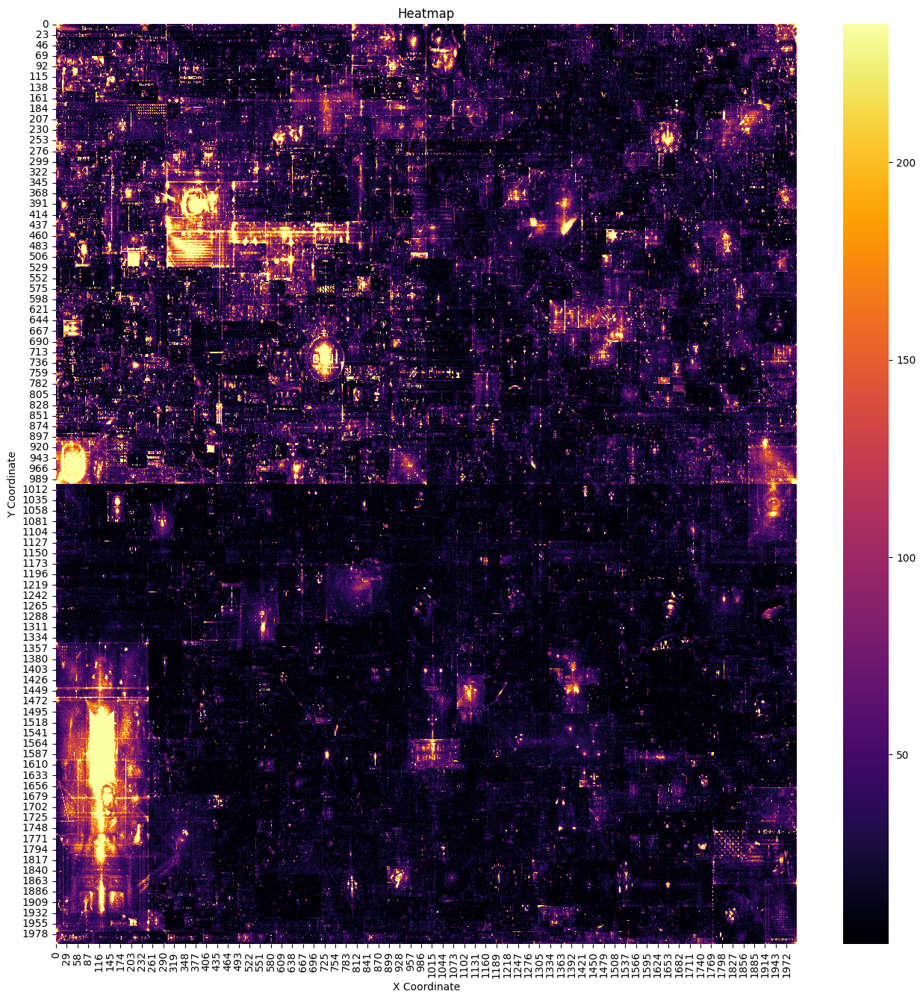

In [12]:
plot_heatmap(df)

In [13]:
def plot_heatmap_log_scale(pivot_df):
    log_pivot_df = np.log1p(pivot_df)  
    
    plt.figure(figsize=(16, 16))
    sns.heatmap(log_pivot_df, cmap="inferno", cbar=True, linewidths=0, robust=True)
    
    plt.title("Loged Heatmap")
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.show()

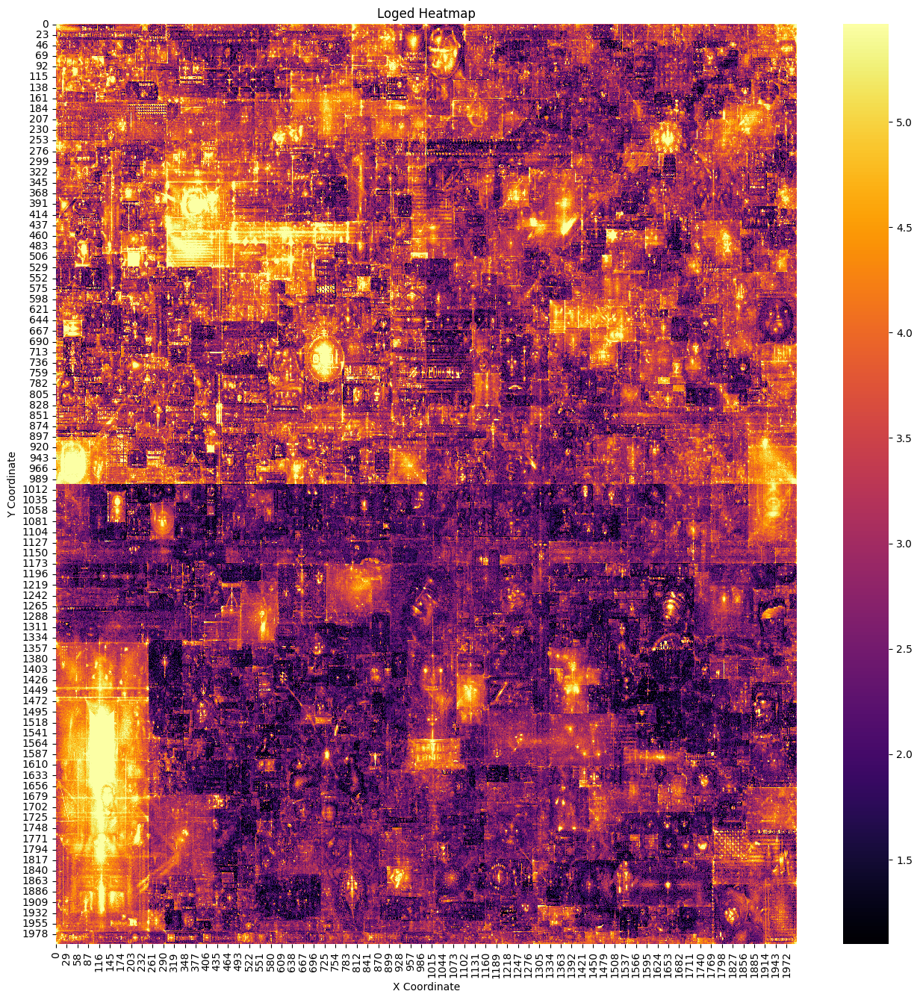

In [14]:
plot_heatmap_log_scale(df)

In [15]:
def quadrant(parquet_file):
    query = f"""
        SELECT 
            strftime(timestamp, '%Y-%m-%d %H:00') AS hour,
            CASE 
                WHEN x < 1000 AND y < 1000 THEN 'Top-left'
                WHEN x >= 1000 AND y < 1000 THEN 'Top-right'
                WHEN x < 1000 AND y >= 1000 THEN 'Bottom-left'
                WHEN x >= 1000 AND y >= 1000 THEN 'Bottom-right'
            END AS quadrant,
            COUNT(*) AS placements
        FROM parquet_scan('{parquet_file}')
        GROUP BY hour, quadrant
        ORDER BY hour
    """
    
    return con.execute(query).fetchdf()

In [16]:
quadrant_df = quadrant(parq)

In [17]:
def plot_quadrants(df):
    plt.figure(figsize=(14, 7))

    df["hour"] = pd.to_datetime(df["hour"])
    for quadrant in df["quadrant"].unique():
        subset = df[df["quadrant"] == quadrant]
        plt.plot(subset["hour"], subset["placements"], label=quadrant, marker="o", linestyle="-")
        
    plt.xlabel("Time (Hourly Bins)")
    plt.ylabel("# of User Color Placements")
    plt.title("User Color Placements Per Hour for Each Quadrant")
    plt.legend()
    plt.grid(True, linestyle="--", linewidth=0.5)
    plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=6))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

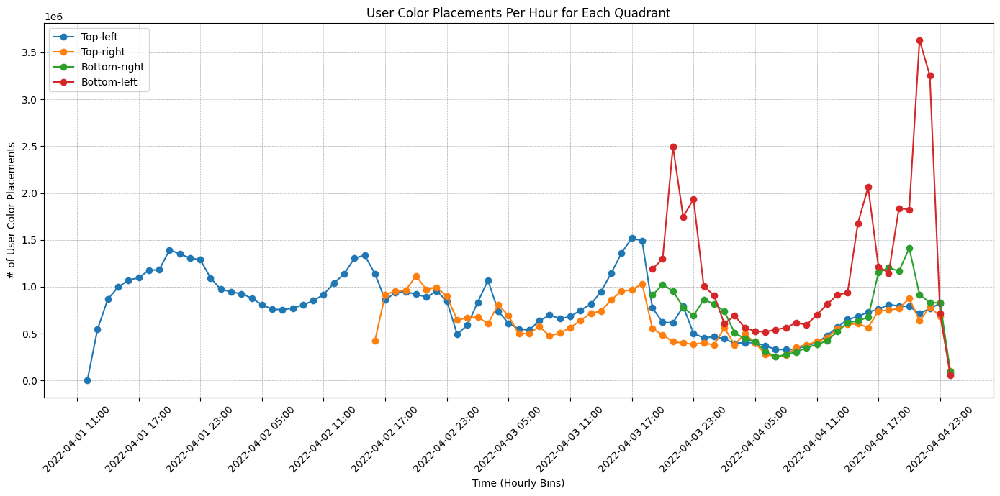

In [18]:

plot_quadrants(quadrant_df)

In [19]:
def hexc(hex_value):
    if isinstance(hex_value, str):
        hex_value = hex_value.strip().lstrip("#")
        if len(hex_value) == 6: 
            return f"#{hex_value}"
    return "#FFFFFF" 

In [20]:
def plot_final_canvas(df):
    plt.figure(figsize=(14, 14))
    df["color"] = df["pixel_color"].apply(hexc)

    # Scatter plot of the final canvas
    plt.scatter(df["x"], df["y"], c=df["color"], s=1, marker="s")
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.title("Final r/place Canvas - Most Recent Color Placements")
    plt.axis("equal")
    plt.show()

In [21]:
def final_canvas(parquet_file):
    query = f"""
        WITH latest_placements AS (
            SELECT x, y, pixel_color, timestamp,
                   ROW_NUMBER() OVER (PARTITION BY x, y ORDER BY timestamp DESC) AS rnk
            FROM parquet_scan('{parquet_file}')
            WHERE timestamp < '2022-04-04 10:00:00'
        )
        SELECT x, y, pixel_color
        FROM latest_placements
        WHERE rnk = 1
    """
    return con.execute(query).fetchdf()

In [22]:
canvas_df = final_canvas(parq)

In [23]:
canvas_df

,x,y,pixel_color
0,452,762,#000000
1,452,1068,#BE0039
2,452,1508,#9C6926
3,453,285,#2450A4
4,453,1038,#493AC1
...,...,...,...
3985644,1127,1738,#000000
3985645,1127,1814,#000000
3985646,1128,68,#2450A4
3985647,1128,142,#FF4500


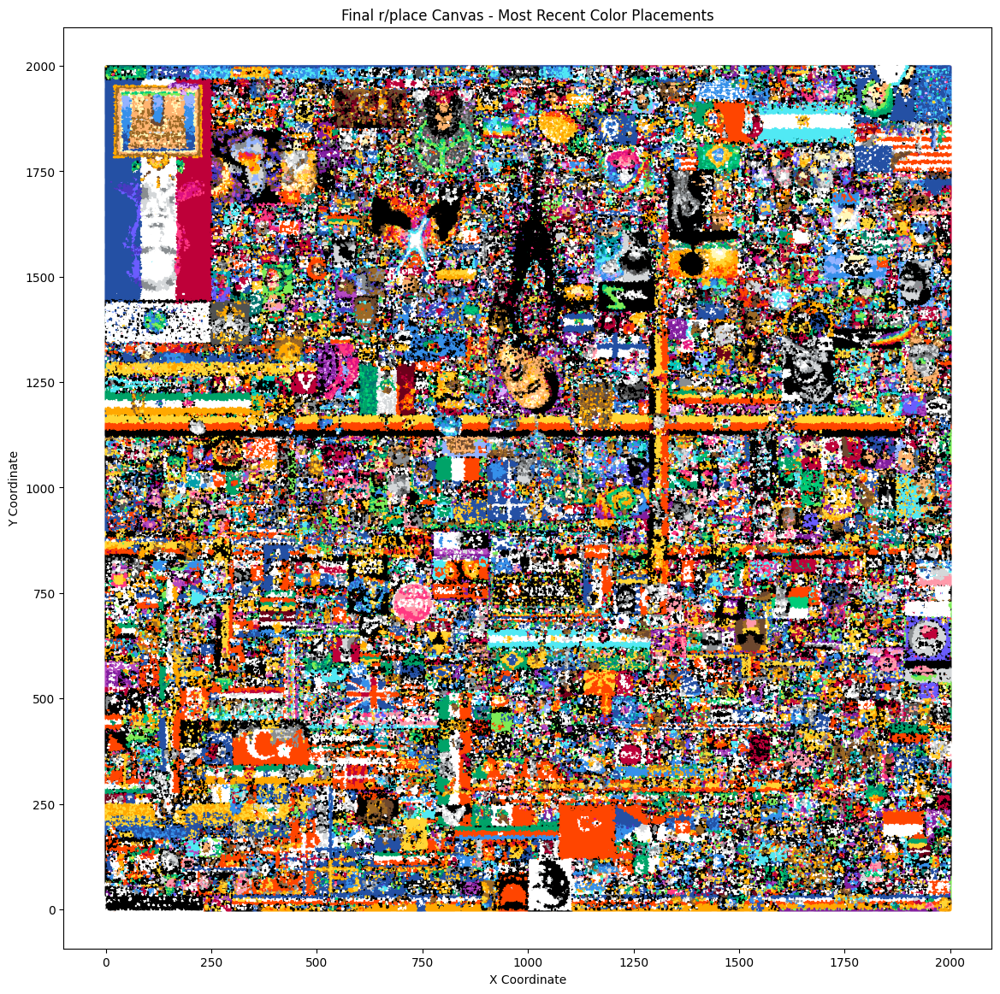

In [24]:
plot_final_canvas(canvas_df)

In [43]:


def countRect(parquet_file, expansion_time):
    query = f"""
        SELECT COUNT(DISTINCT user_id) AS unique_users_in_qiii_bottom_left
        FROM parquet_scan('{parquet_file}')
        WHERE timestamp >= '{expansion_time}' 
          AND x BETWEEN 0 AND 250 
          AND y BETWEEN 1350 AND 2000
    """
    return con.execute(query).fetchdf().iloc[0, 0]

expansion_time = "2022-04-03 19:30:00"  
q3 = countRect(parq, expansion_time)

print(f"Number of unique users in QIII bottom-left area: {q3}")


Number of unique users in QIII bottom-left area: 2658930


In [44]:
def countExp(parquet_file, expansion_time):
    query = f"""
        SELECT COUNT(DISTINCT user_id) AS unique_users_before_expansion
        FROM parquet_scan('{parquet_file}')
        WHERE timestamp < '{expansion_time}'
    """
    return con.execute(query).fetchdf().iloc[0, 0]

bExp = countExp(parq, expansion_time)

print(f"Number of unique users before the 3rd expansion: {bExp}")

Number of unique users before the 3rd expansion: 6072259


In [45]:
def totalusers(parquet_file):
    query = f"""
        SELECT COUNT(DISTINCT user_id) AS total_users
        FROM parquet_scan('{parquet_file}')
    """
    return con.execute(query).fetchdf().iloc[0, 0]

total_users = totalusers(parq)

In [46]:
total_users

np.int64(10381144)

In [47]:
def migrated(parquet_file, expansion_time):
    query = f"""
        SELECT COUNT(DISTINCT before.user_id) AS migrating_users
        FROM (
            SELECT DISTINCT user_id 
            FROM parquet_scan('{parquet_file}')
            WHERE timestamp < '{expansion_time}'
        ) AS before
        INNER JOIN (
            SELECT DISTINCT user_id 
            FROM parquet_scan('{parquet_file}')
            WHERE timestamp >= '{expansion_time}' 
              AND x BETWEEN 0 AND 250 
              AND y BETWEEN 1350 AND 2000
        ) AS after
        ON before.user_id = after.user_id
    """
    return con.execute(query).fetchdf().iloc[0, 0]

migrated = migrated(parq, expansion_time)

print(f"Number of users who migrated to QIII bottom-left: {migrated}")


Number of users who migrated to QIII bottom-left: 1039839


In [51]:
def userActUniq(parquet_file, expansion_time):
    query = f"""
        SELECT 
            strftime(timestamp, '%Y-%m-%d %H:00') AS hour, 
            COUNT(DISTINCT user_id) AS unique_users
        FROM parquet_scan('{parquet_file}')
        WHERE timestamp >= '{expansion_time}'
          AND x BETWEEN 0 AND 250
          AND y BETWEEN 1350 AND 2000
        GROUP BY hour
        ORDER BY hour
    """
    return con.execute(query).fetchdf()

In [52]:

userActU = userActUniq(parq, expansion_time)

In [59]:
def userAct(parquet_file, expansion_time):
    query = f"""
        SELECT 
            strftime(timestamp, '%Y-%m-%d %H:00') AS hour, 
            COUNT(user_id) AS unique_users
        FROM parquet_scan('{parquet_file}')
        WHERE timestamp >= '{expansion_time}'
          AND x BETWEEN 0 AND 250
          AND y BETWEEN 1350 AND 2000
        GROUP BY hour
        ORDER BY hour
    """
    return con.execute(query).fetchdf()

In [60]:
act_df = userActUniq(parq, expansion_time)

In [64]:
def plotUserAct(df, label):
    plt.figure(figsize=(14, 7))
    df["hour"] = pd.to_datetime(df["hour"])
    plt.plot(df["hour"], df["unique_users"], marker="o", linestyle="-", color="b", label=label)

    plt.xlabel("Time (Hourly Bins)")
    plt.ylabel("# of Users Placing Pixels")
    plt.title("User Activity")
    plt.legend()
    plt.grid(True, linestyle="--", linewidth=0.5)
    plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=1)) 
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
    plt.xticks(rotation=45, fontsize=8)  

    plt.tight_layout()
    plt.show()


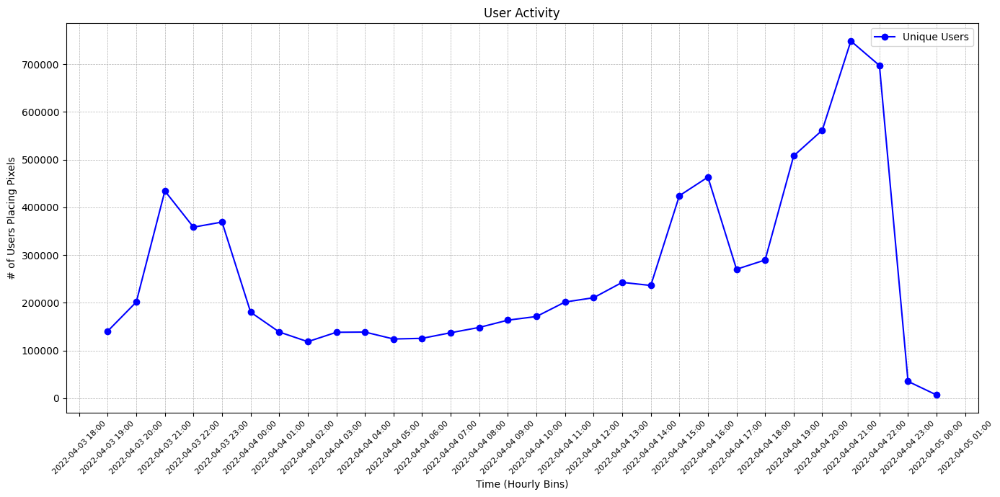

In [65]:

plotUserAct(userActU,label="Unique Users")


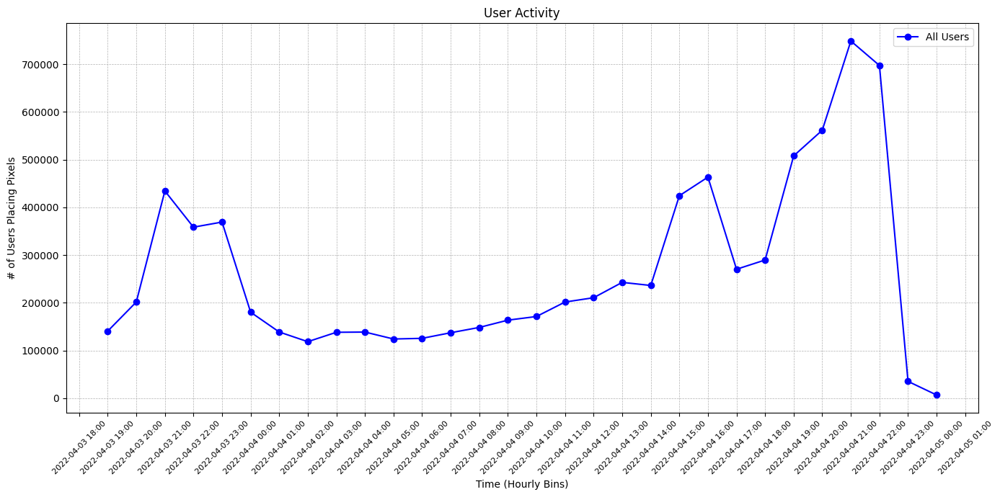

In [66]:
plotUserAct(act_df, label="All Users")
